# To build a model for training and testing

In [1]:
import os
import numpy as np # linear algebra
import matplotlib.pyplot as plt

In [2]:
# Dl framwork - tensorflow, keras a backend 
import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input, Dense, Flatten, Dropout, BatchNormalization 
from tensorflow.keras.layers import Conv2D, SeparableConv2D, MaxPool2D, LeakyReLU, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from IPython.display import display
from os import listdir
from os.path import isfile, join
from PIL import Image
import glob
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Convolution2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
dir_name_train_freshapples = 'datasets/train/freshapples/'
dir_name_train_freshbanana = 'datasets/train/freshbanana/'
dir_name_train_freshoranges = 'datasets/train/freshoranges/'
dir_name_train_rottenapples = 'datasets/train/rottenapples/'
dir_name_train_rottenbanana = 'datasets/train/rottenbanana/'
dir_name_train_rottenoranges = 'datasets/train/rottenoranges/'

In [5]:
def plot_images(item_dir, n=6):
    all_item_dir = os.listdir(item_dir)
    item_files = [os.path.join(item_dir, file) for file in all_item_dir][:n]
    
    plt.figure(figsize=(80, 40))
    for idx, img_path in enumerate(item_files):
        plt.subplot(7, n, idx+1)
        img = plt.imread(img_path)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()

In [6]:
def Images_details_Print_data(data, path):
    print(" ====== Images in: ", path)    
    for k, v in data.items():
        print("%s:\t%s" % (k, v))

def Images_details(path):
    files = [f for f in glob.glob(path + "**/*.*", recursive=True)]
    data = {}
    data['images_count'] = len(files)
    data['min_width'] = 10**100  # No image will be bigger than that
    data['max_width'] = 0
    data['min_height'] = 10**100  # No image will be bigger than that
    data['max_height'] = 0


    for f in files:
        im = Image.open(f)
        width, height = im.size
        data['min_width'] = min(width, data['min_width'])
        data['max_width'] = max(width, data['max_height'])
        data['min_height'] = min(height, data['min_height'])
        data['max_height'] = max(height, data['max_height'])

    Images_details_Print_data(data, path)


Trainned data for freshapples: 

 ====== Images in:  datasets/train/freshapples/
images_count:	200
min_width:	150
max_width:	510
min_height:	152
max_height:	510



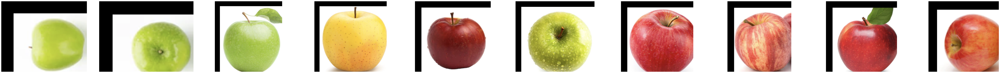

In [7]:
print("")
print("Trainned data for freshapples: ")
print("")
Images_details(dir_name_train_freshapples)
print("")
plot_images(dir_name_train_freshapples, 10)


Trainned data for freshbanana: 

 ====== Images in:  datasets/train/freshbanana/
images_count:	200
min_width:	174
max_width:	560
min_height:	128
max_height:	496



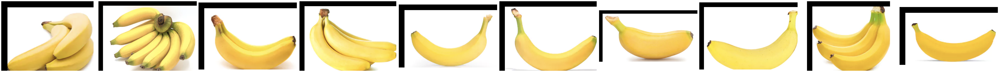

In [8]:
print("")
print("Trainned data for freshbanana: ")
print("")
Images_details(dir_name_train_freshbanana)
print("")
plot_images(dir_name_train_freshbanana, 10)


Trainned data for freshoranges: 

 ====== Images in:  datasets/train/freshoranges/
images_count:	200
min_width:	144
max_width:	478
min_height:	140
max_height:	478



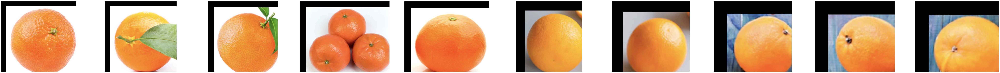

In [9]:
print("")
print("Trainned data for freshoranges: ")
print("")
Images_details(dir_name_train_freshoranges)
print("")
plot_images(dir_name_train_freshoranges, 10)


Trainned data for rottenapples: 

 ====== Images in:  datasets/train/rottenapples/
images_count:	200
min_width:	210
max_width:	474
min_height:	194
max_height:	474



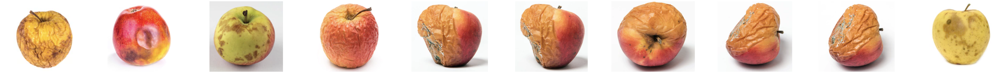

In [10]:
print("")
print("Trainned data for rottenapples: ")
print("")
Images_details(dir_name_train_rottenapples)
print("")
plot_images(dir_name_train_rottenapples, 10)


Trainned data for rottenbanana: 

 ====== Images in:  datasets/train/rottenbanana/
images_count:	200
min_width:	188
max_width:	566
min_height:	194
max_height:	518



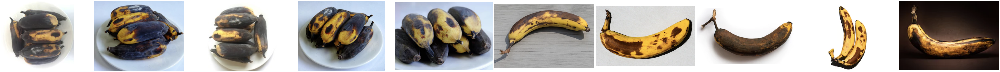

In [11]:
print("")
print("Trainned data for rottenbanana: ")
print("")
Images_details(dir_name_train_rottenbanana)
print("")
plot_images(dir_name_train_rottenbanana, 10)


Trainned data for rottenoranges: 

 ====== Images in:  datasets/train/rottenoranges/
images_count:	200
min_width:	144
max_width:	496
min_height:	116
max_height:	496



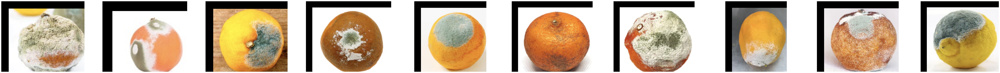

In [12]:
print("")
print("Trainned data for rottenoranges: ")
print("")
Images_details(dir_name_train_rottenoranges)
print("")
plot_images(dir_name_train_rottenoranges, 10)

In [13]:
Classifier=Sequential()
Classifier.add(Convolution2D(32,(3,3),input_shape=(250,250,3),activation='relu'))
Classifier.add(MaxPooling2D(pool_size=(2,2)))
Classifier.add(Flatten())
Classifier.add(Dense(38, activation='relu'))

In [14]:
Classifier.add(Dense(6, activation='softmax'))
Classifier.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [15]:
train_datagen=ImageDataGenerator(rescale=1./255,shear_range=0.2,zoom_range=0.2,horizontal_flip=True)
test_datagen=ImageDataGenerator(rescale=1./255)

In [16]:
training_set=train_datagen.flow_from_directory('datasets/train',target_size=(250,250),batch_size=16,class_mode='categorical')
test_set=test_datagen.flow_from_directory('datasets/test',target_size=(250,250),batch_size=16,class_mode='categorical')

Found 1200 images belonging to 6 classes.
Found 600 images belonging to 6 classes.


In [17]:
epochs = 10
batch_size = 16

In [ ]:
#### Fitting the model
history = Classifier.fit(
           training_set, steps_per_epoch=training_set.samples // batch_size, 
           epochs=epochs, 
           validation_data=test_set,validation_steps=test_set.samples // batch_size)

Epoch 1/10


75/75 [==============================] - 74s 945ms/step - loss: 3.8405 - accuracy: 0.2325 - val_loss: 1.9757 - val_accuracy: 0.2230
Epoch 2/10
75/75 [==============================] - 67s 893ms/step - loss: 1.6917 - accuracy: 0.3000 - val_loss: 1.8064 - val_accuracy: 0.2686
Epoch 3/10
75/75 [==============================] - 67s 889ms/step - loss: 1.6413 - accuracy: 0.3167 - val_loss: 1.8913 - val_accuracy: 0.2753
Epoch 4/10
75/75 [==============================] - 69s 920ms/step - loss: 1.6840 - accuracy: 0.2650 - val_loss: 1.7950 - val_accuracy: 0.1672
Epoch 5/10
75/75 [==============================] - 68s 904ms/step - loss: 1.7940 - accuracy: 0.1675 - val_loss: 1.7925 - val_accuracy: 0.1723
Epoch 6/10
43/75 [================>.............] - ETA: 24s - loss: 1.7901 - accuracy: 0.1628

In [ ]:
def accuracy():
    #Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()
accuracy()

In [ ]:
def loss():
    # Plot training & validation loss values
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()
loss()